# LDR - features, HDBSCAN clustering

### Imports & loading and preprocessing LDR sensor data

/Users/uge/anaconda/envs/py35/lib/python3.5/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


***TIMEIT get_all_data TOOK: 0.976 s
LDR Raw Data (from 12-08-16 to 14-09-16):
       count  mean  std  min  25%  50%  75%  max
ldr  2725278   251  234   11   33  162  478  748
LOAD LDR DATA TOOK: 3.289 s
LDR por minutos. 47674 --> 45738 válidos. Head:
                           median  std  _step   altitude    azimuth  \
ts                                                                    
2016-08-12 10:48:00+02:00     656    0     -1  40.089949 -75.799303   
2016-08-12 10:49:00+02:00     654    0     -2  40.278964 -75.602273   
2016-08-12 10:50:00+02:00     654    0     -1  40.467812 -75.404416   
2016-08-12 10:51:00+02:00     656    0      3  40.656493 -75.205719   
2016-08-12 10:52:00+02:00     656    0      0  40.844999 -75.006168   

                           median_d1  altitude_d1  azimuth_d1  median_d2  \
ts                                                                         
2016-08-12 10:48:00+02:00       -1.0     0.189179    0.196218       -2.0   
2016-08-12 10:49:00+0

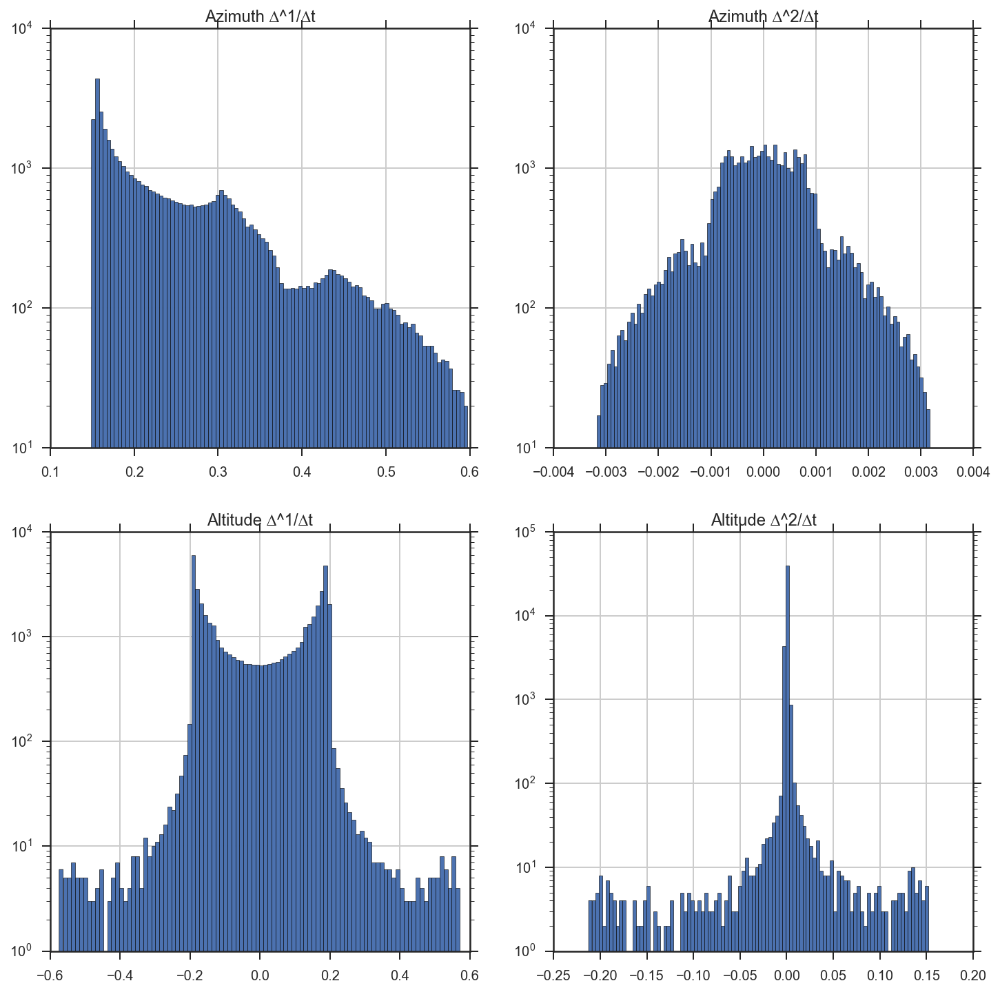

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
from IPython.display import Image, HTML

import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
import math
import datetime as dt
import pandas as pd
import numpy as np
import pytz
import matplotlib.dates as mpd
from mpl_toolkits.mplot3d import Axes3D
import scipy
from scipy import signal
from scipy.signal import medfilt
import numexpr as ne
from patsy import dmatrices
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.cross_validation import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, Normalizer, MinMaxScaler, Binarizer
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, Birch, AffinityPropagation
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, KernelPCA, MiniBatchSparsePCA, IncrementalPCA
from hdbscan import HDBSCAN
import statsmodels.api as sm
import random

from enerpi.base import timeit
from enerpi.api import enerpi_data_catalog
from enerpi.enerplot import write_fig_to_svg, tableau20
from enerpi.sunposition import sun_position
from prettyprinting import *


def _f_perc(y):
    def __perc(x):
        return np.percentile(x[np.isfinite(x)], y) if np.isfinite(x).sum() > 5 else np.nan
    __perc.__name__ = 'perc_{}'.format(y)
    return __perc


def _step(x):
    __name__ = 'step'
    return x[-1] - x[0]


@timeit('gen_data_ldr_minutes', verbose=True)
def gen_data_ldr_minutes(homog):
    rs = homog.resample('1min')
    ldr_minutos_smin = rs.ldr.min()
    minutos_no_nulos_mask = ldr_minutos_smin > 0
    
    ldr_minutos = rs.median_filter.agg(['median', 'std', _step]).astype('int32') #.unstack()
    ldr_minutos = ldr_minutos.join(sun_position(ldr_minutos.index, latitude_deg=LAT, longitude_deg=LONG, elevation=ELEV_M))  # .round(1)
    
    cols_deriv_t = ['median', 'altitude', 'azimuth']
    ldr_minutos_d1 = ldr_minutos[cols_deriv_t].diff().rename(columns=lambda x: x + '_d1')
    ldr_minutos_d1.loc[ldr_minutos_d1['azimuth_d1'].abs() > 100, 'azimuth_d1'] += 360
    ldr_minutos_d2 = ldr_minutos_d1.diff().rename(columns=lambda x: x[:-1] + '2')

    ldr_minutos = ldr_minutos.join(ldr_minutos_d1.join(ldr_minutos_d2))
    ldr_usar = ldr_minutos[minutos_no_nulos_mask].dropna()
    print_red('LDR por minutos. {} --> {} válidos. Head:\n{}'.format(len(ldr_minutos), len(ldr_usar), ldr_usar.head()))
    return ldr_usar


@timeit('LOAD LDR DATA', verbose=True)
def load_data():
    # Catálogo y lectura de todos los datos.
    cat = enerpi_data_catalog()
    data, data_s = cat.get_all_data()
    LDR = pd.DataFrame(data.ldr).tz_localize(TZ)
    print_cyan('LDR Raw Data (from {:%d-%m-%y} to {:%d-%m-%y}):\n{}'.format(LDR.index[0], LDR.index[-1], LDR.describe().T.astype(int)))
    
    homog = LDR.resample('1s').mean().fillna(method='ffill', limit=5).fillna(method='bfill', limit=5).fillna(-1)
    homog['median_filter'] = medfilt(homog.ldr, kernel_size=7)
    return homog, data, data_s



LAT = 38.631463
LONG = -0.866402
ELEV_M = 500
TZ = pytz.timezone('Europe/Madrid')
FS = (16, 10)
sns.set_style('ticks')


homog, raw, hourly_data = load_data()
ldr_minutos = gen_data_ldr_minutes(homog)
homog.info()
ldr_minutos.info()

print_info('Plot distribuciones de derivadas 1ª y 2ª de altura y azimut solar (presentan continuidad)')
_, axes = plt.subplots(2, 2, figsize=(12, 12))
columns = ['azimuth_d1', 'azimuth_d2', 'altitude_d1', 'altitude_d2']
for c, ax in zip(columns, axes.ravel()):
    ldr_minutos[c].hist(bins=100, log=True, ax=ax)
    ax.set_title(c.capitalize().replace('_d', ' ∆^') + '/∆t')

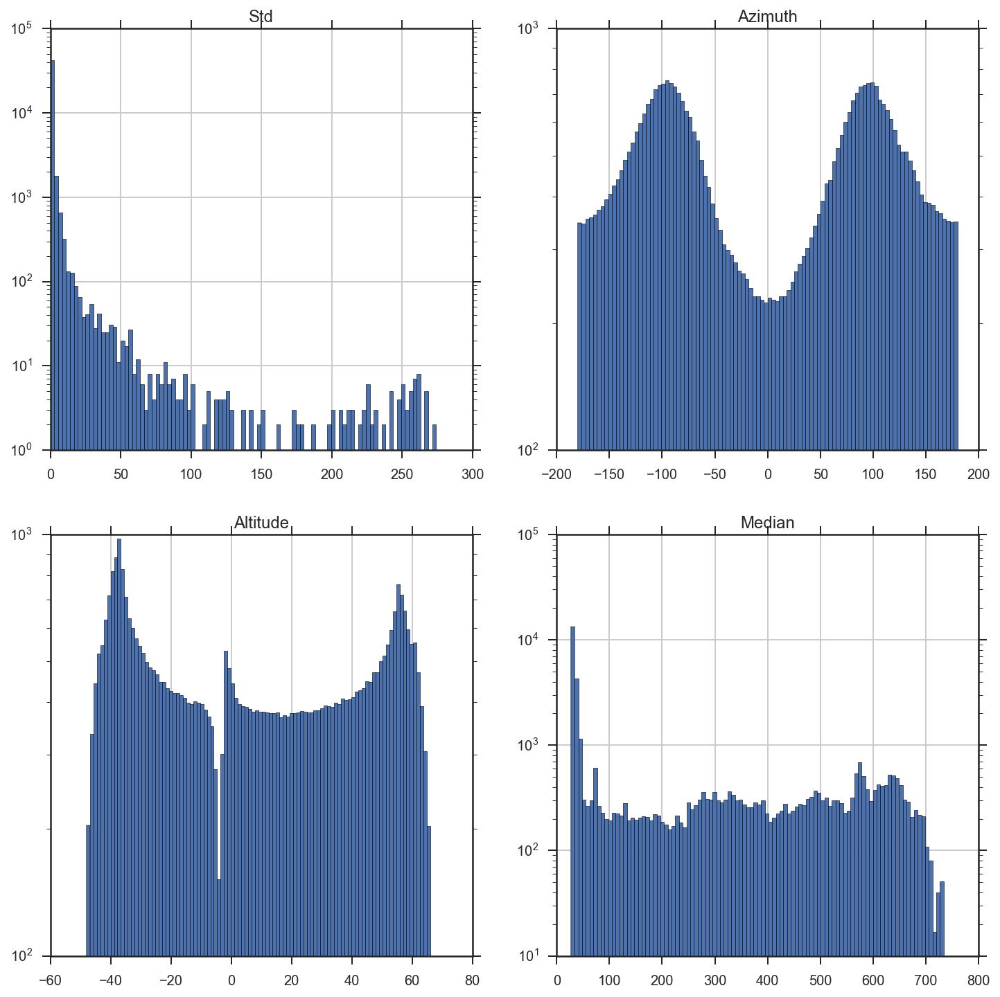

In [47]:
_, axes = plt.subplots(2, 2, figsize=(12, 12))
columns = ['std', 'azimuth', 'altitude', 'median']
for c, ax in zip(columns, axes.ravel()):
    ldr_minutos[c].hist(bins=100, log=True, ax=ax)
    ax.set_title(c.capitalize())

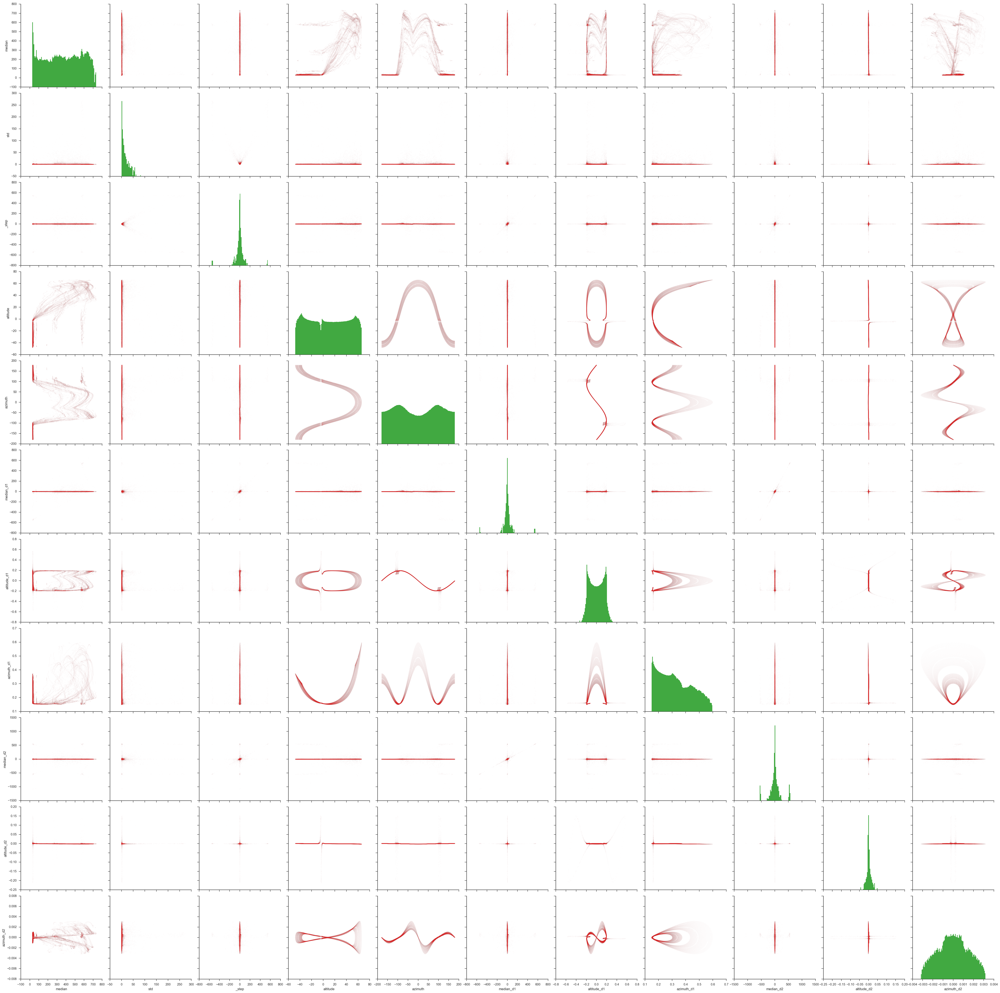

In [73]:
sns.pairplot(ldr_minutos, size=4, 
             plot_kws=dict(lw=0, alpha=.01, s=4, color=tableau20[6]),
             diag_kind='hist', diag_kws=dict(bins=100, lw=0, log=True, facecolor=tableau20[4], alpha=.9))

In [2]:
X = ldr_minutos.values
X_std = StandardScaler().fit_transform(X)
X_pca = PCA(n_components=2, whiten=True).fit_transform(X_std)
X_pca3 = PCA(n_components=3, whiten=True).fit_transform(X_std)

X.shape, X_std.shape, X_pca.shape, X_pca3.shape

((45738, 11), (45738, 11), (45738, 2), (45738, 3))

(45738, 11)
17


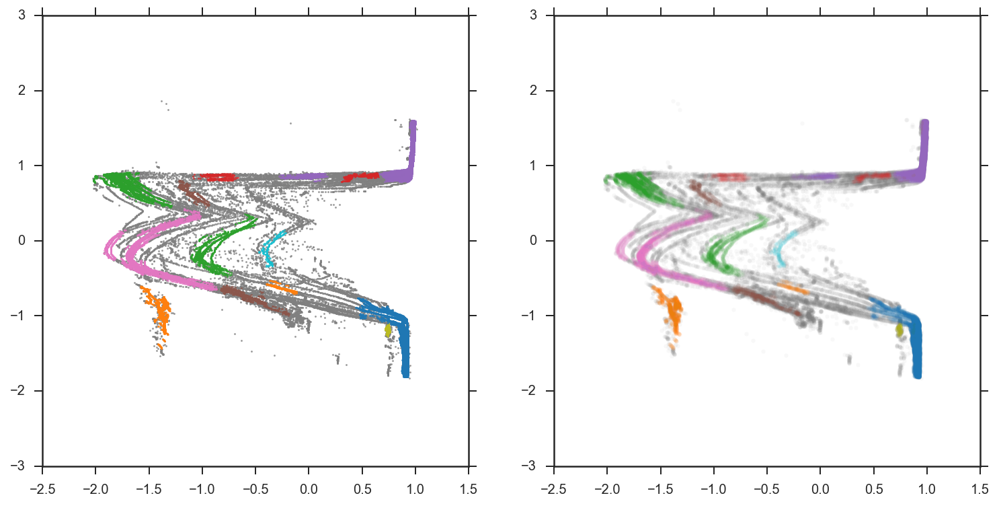

(45738, 11)
10


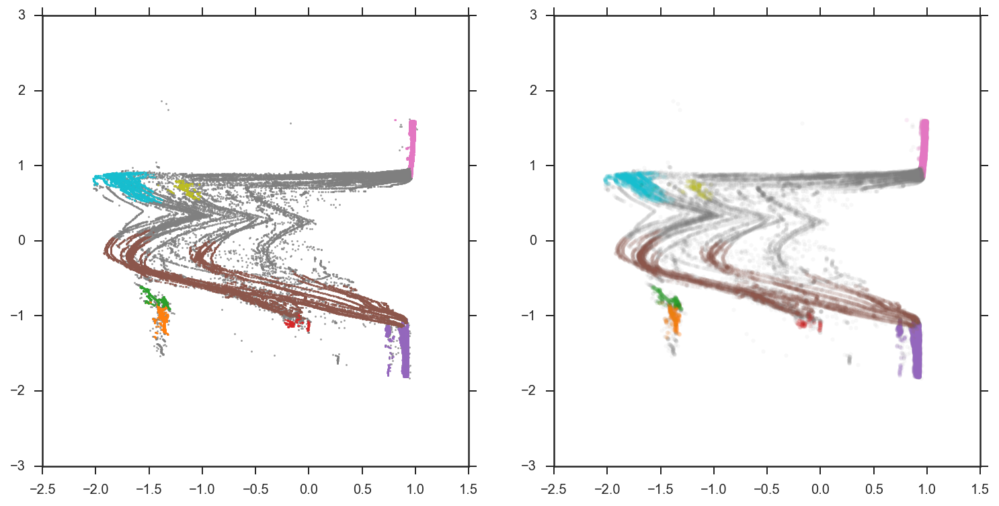

(45738, 2)
21


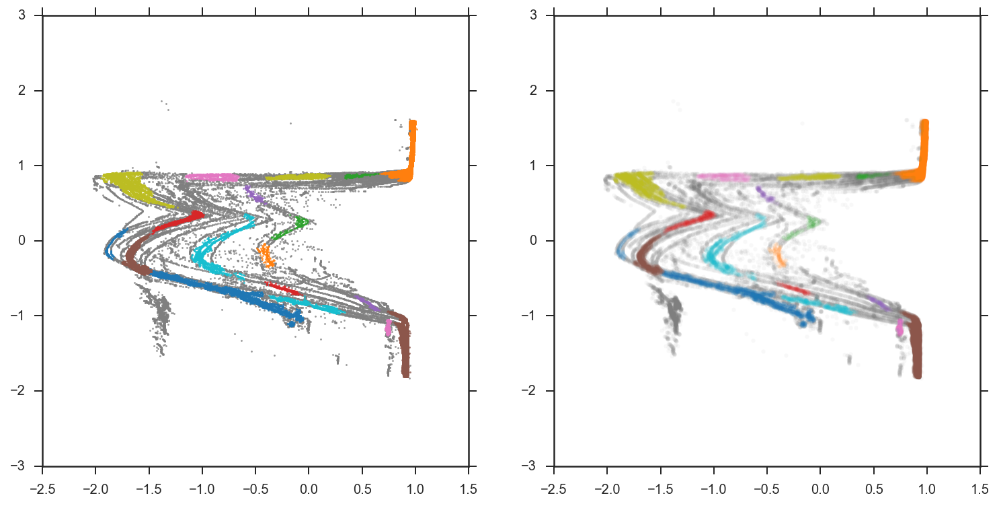

(45738, 3)
18


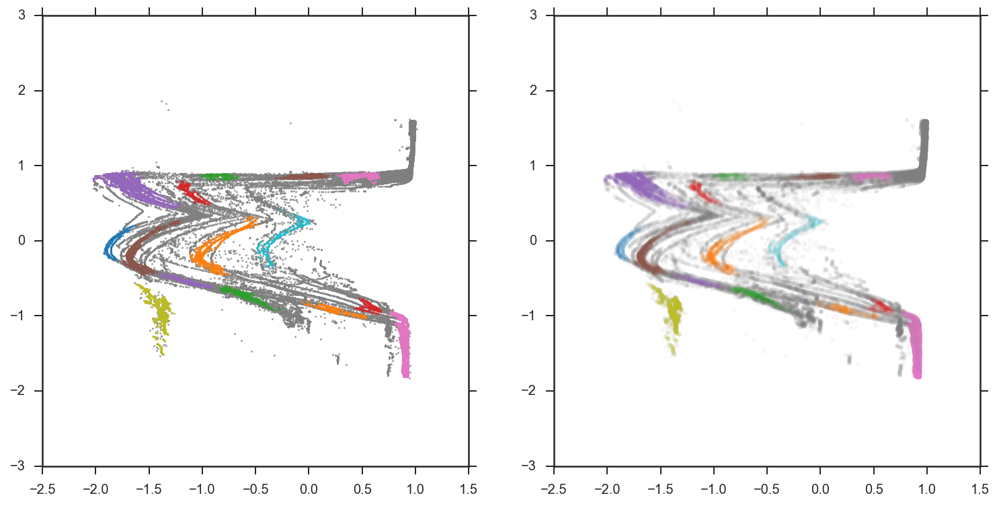

In [86]:
def _plot_scatter(x, labels=None):
    cmap_ctableau = cycle(tableau20[::2])
    f, axes = plt.subplots(1, 2, figsize=(12.5, 6))
    if labels is None:
        axes[0].scatter(x[:,0], x[:,1], c=tableau20[4], lw=0, s=2, alpha=.8)
        axes[1].scatter(x[:,0], x[:,1], c=tableau20[4], lw=0, s=10, alpha=.05)
    else:
        for k, col in zip(sorted(set(labels)), cmap_ctableau):
            if k == -1:
                col = 'grey'
            mask = labels == k
            axes[0].scatter(x[mask,0], x[mask,1], c=col, lw=0, s=2, alpha=.8)
            axes[1].scatter(x[mask,0], x[mask,1], c=col, lw=0, s=10, alpha=.05)
    return axes


for x, x_plot in zip([X, X_std, X_pca, X_pca3], [X_pca, X_pca, X_pca, X_pca3]):
    print_info(x.shape)
    clusterer_hdbscan = HDBSCAN(min_cluster_size=100, min_samples=50).fit(x)
    print_red(len(set(clusterer_hdbscan.labels_)))
    _plot_scatter(x_plot, clusterer_hdbscan.labels_)
    plt.show()

In [ ]:
tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(X_pca3)
tsne

In [ ]:
#clusterer = AffinityPropagation(preference=-250).fit(X_std)
print_red(len(set(clusterer.labels_)))
_plot_scatter(X_pca, clusterer.labels_)

In [ ]:
clusterer = KMeans(n_clusters=7).fit(X_pca)
print_red(len(set(clusterer.labels_)))
_plot_scatter(X_pca, clusterer.labels_)

In [ ]:
ldr_minutos.head()

In [1]:
features = homog.median_filter.iloc[:1000000].resample('1min').agg(['min', 'max', 'median', 'std', _step])
print_cyan(features.head())
f_sol = sun_position(features.index)
features = f_sol.join(features)
features['minuteofday'] = features.index.hour * 60 + features.index.minute
features['dayofyear'] = features.index.dayofyear
features.tail()

for x in [X, X_kpca_std, X_pca, tsne_reduced]:
    print_info(x.shape)
    clusterer_hdbscan = HDBSCAN(min_cluster_size=10, min_samples=100).fit(x)
    print_red(len(set(clusterer_hdbscan.labels_)))
    _plot_scatter(x, clusterer_hdbscan.labels_)
    _plot_scatter(X_pca, clusterer_hdbscan.labels_)
    plt.show()

NameError: name 'X' is not defined

In [8]:
sm.OLS(X_std[:,0], X_std[:,1:]).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.684
Method:                 Least Squares   F-statistic:                     9886.
Date:                vie, 23 sep 2016   Prob (F-statistic):               0.00
Time:                        20:30:03   Log-Likelihood:                -38572.
No. Observations:               45738   AIC:                         7.716e+04
Df Residuals:                   45728   BIC:                         7.725e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
x1             0.0162      0.003      6.132      0.000         0.011     0.021
x2            -0.0304      0.003    -10.426      0.000        -0.036    -0.025
x3             0.7895      0.003    284.096      0.000         0.784     0.795
x4             0.0331      0.005      6.132      0.000         0.023     0.044
x5             0.1364      0.004     33.931      0.000         0.129     0.144
x6            -0.0466      0.006     -8.456      0.000        -0.057    -0.036
x7             0.0735      0.003     26.500      0.000         0.068     0.079
x8            -0.0823      0.004    -21.389      0.000        -0.090    -0.075
x9             0.0053      0.003      1.996      0.046      9.61e-05     0.010
x10            0.0604      0.003     19.027      0.000         0.054     0.067
==============================================================================
Omnibus:                     7805.082   Durbin-Watson:                   0.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15864.194
Skew:                           1.032   Prob(JB):                         0.00
Kurtosis:                       5.017   Cond. No.                         4.16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [9]:
sm.OLS(ldr_minutos['median'], ldr_minutos.drop(['median'], axis=1)).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 median   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                  0.138
Method:                 Least Squares   F-statistic:                     734.6
Date:                vie, 23 sep 2016   Prob (F-statistic):               0.00
Time:                        20:36:23   Log-Likelihood:            -2.9242e+05
No. Observations:               45738   AIC:                         5.849e+05
Df Residuals:                   45728   BIC:                         5.849e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
std             0.5942      0.053     11.121      0.000         0.489     0.699
_step          -0.2201      0.025     -8.899      0.000        -0.269    -0.172
altitude        4.8749      0.020    244.859      0.000         4.836     4.914
azimuth         0.0778      0.013      5.930      0.000         0.052     0.104
median_d1       1.0473      0.034     30.852      0.000         0.981     1.114
altitude_d1   -64.0252      9.160     -6.989      0.000       -81.980   -46.071
azimuth_d1    773.3590      2.675    289.064      0.000       768.115   778.603
median_d2      -0.4237      0.022    -19.440      0.000        -0.466    -0.381
altitude_d2   207.0084     64.803      3.194      0.001        79.994   334.023
azimuth_d2   1.365e+04    833.866     16.374      0.000       1.2e+04  1.53e+04
==============================================================================
Omnibus:                     7131.709   Durbin-Watson:                   0.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15960.730
Skew:                           0.916   Prob(JB):                         0.00
Kurtosis:                       5.240   Cond. No.                     1.30e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.3e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

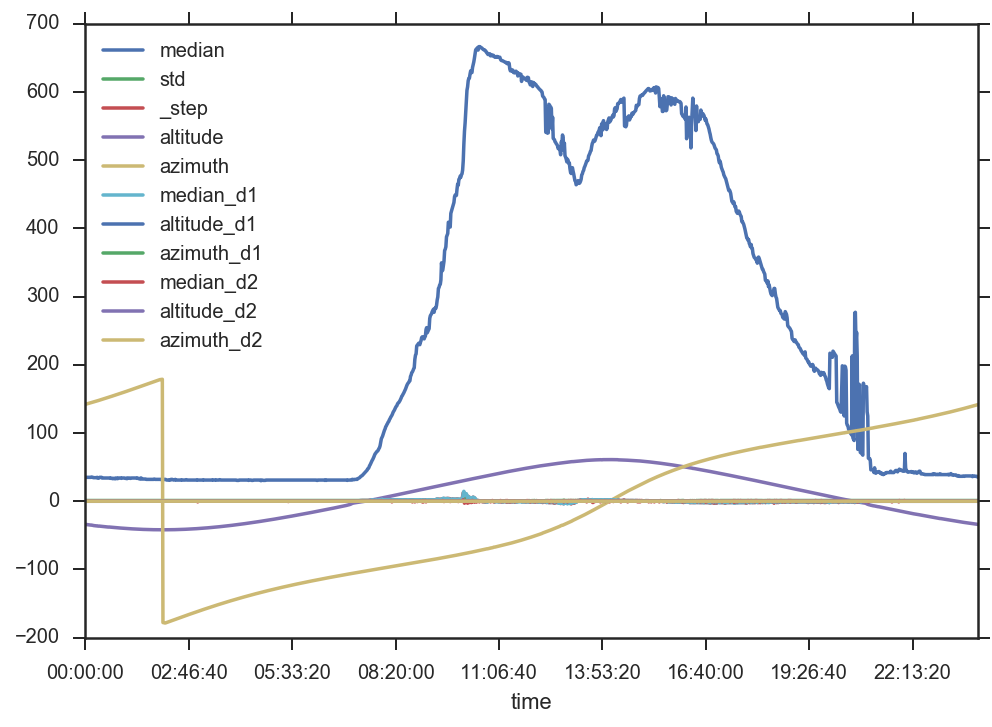

In [14]:
ldr_minutos.groupby(lambda x: x.time).median().plot()

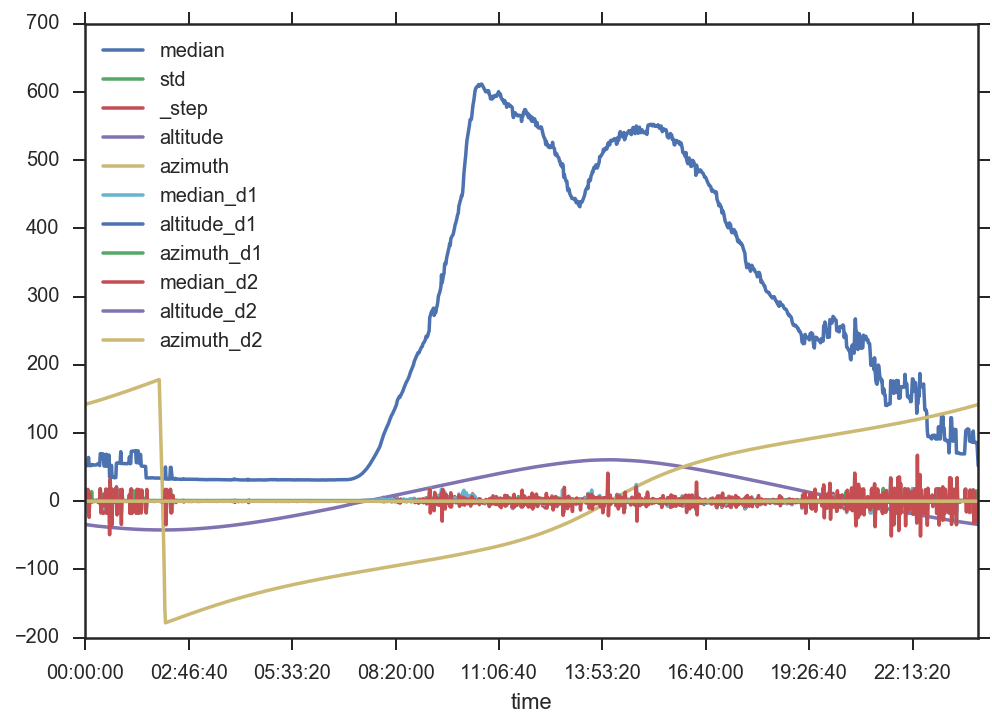

In [15]:
ldr_minutos.groupby(lambda x: x.time).mean().plot()

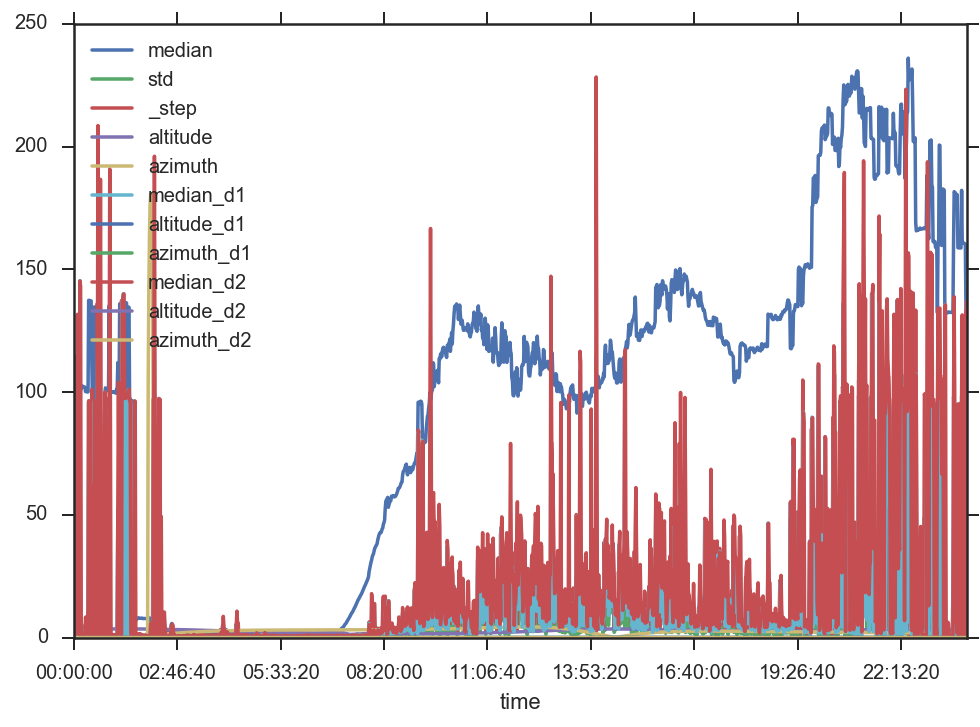

In [19]:
ldr_minutos.groupby(lambda x: x.time).std().plot()

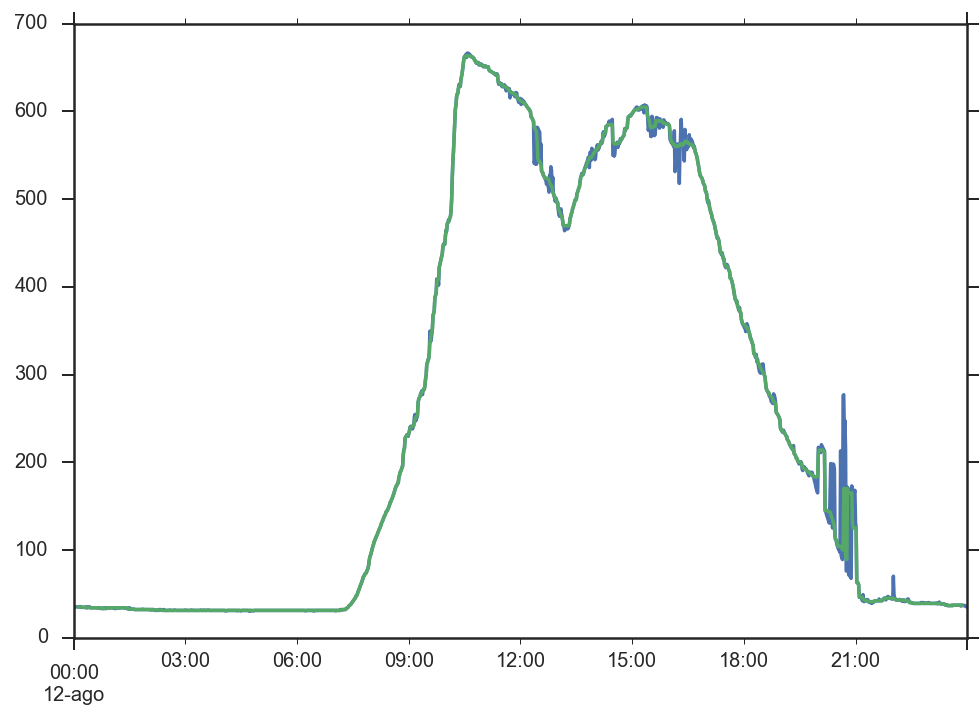

In [36]:
median_daily = ldr_minutos.groupby(lambda x: x.time)['median'].median()
day = ldr_minutos.index[0].date()
median_daily.index = pd.DatetimeIndex(([dt.datetime.combine(day, t) for t in median_daily.index]))
median_daily.plot()

median_daily.rolling(15, center=True).median().plot()

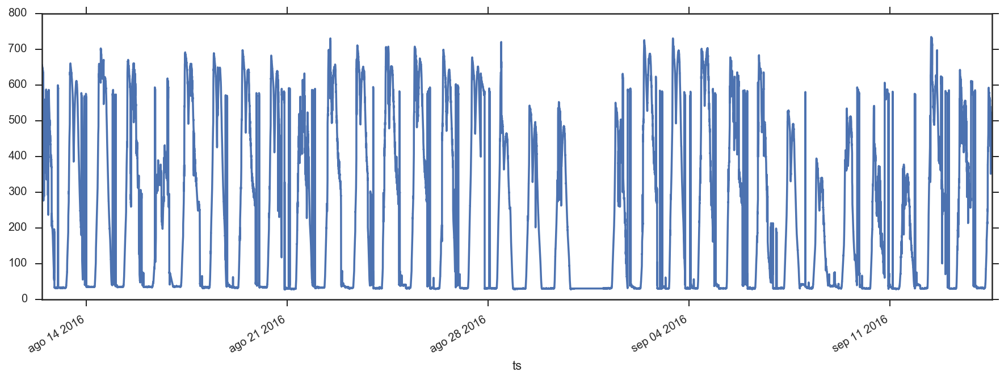

In [37]:
ldr_minutos['median'].plot(figsize=(15, 5))

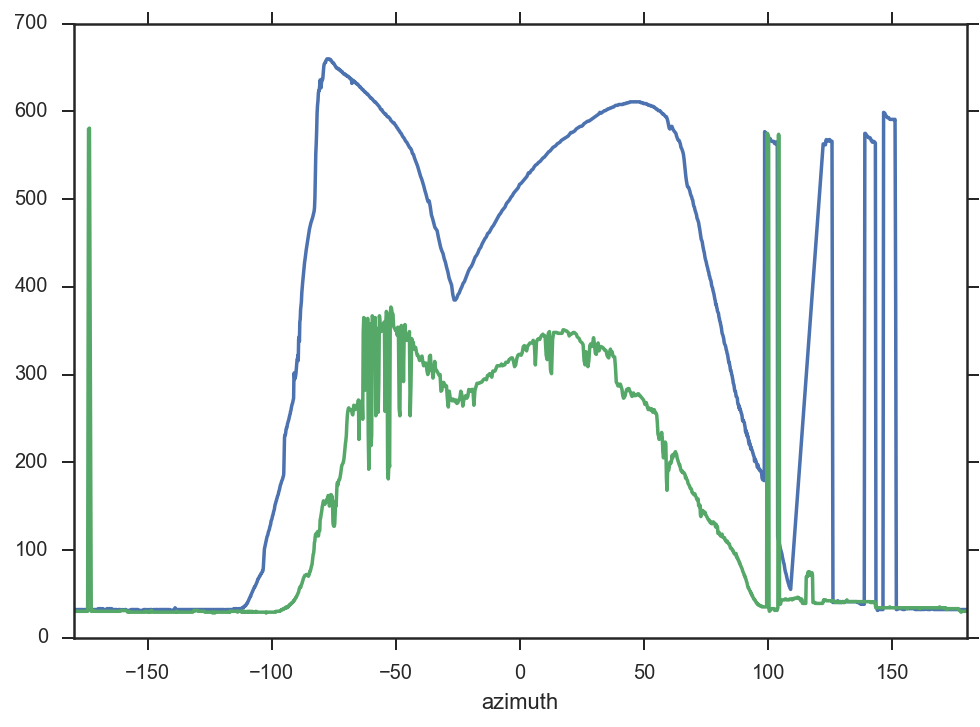

In [47]:
ldr_minutos.loc['2016-08-13'].set_index('azimuth')['median'].sort_index().plot()
#ldr_minutos.loc['2016-09-01'].set_index('azimuth')['median'].sort_index().plot()
ldr_minutos.loc['2016-09-11'].set_index('azimuth')['median'].sort_index().plot()

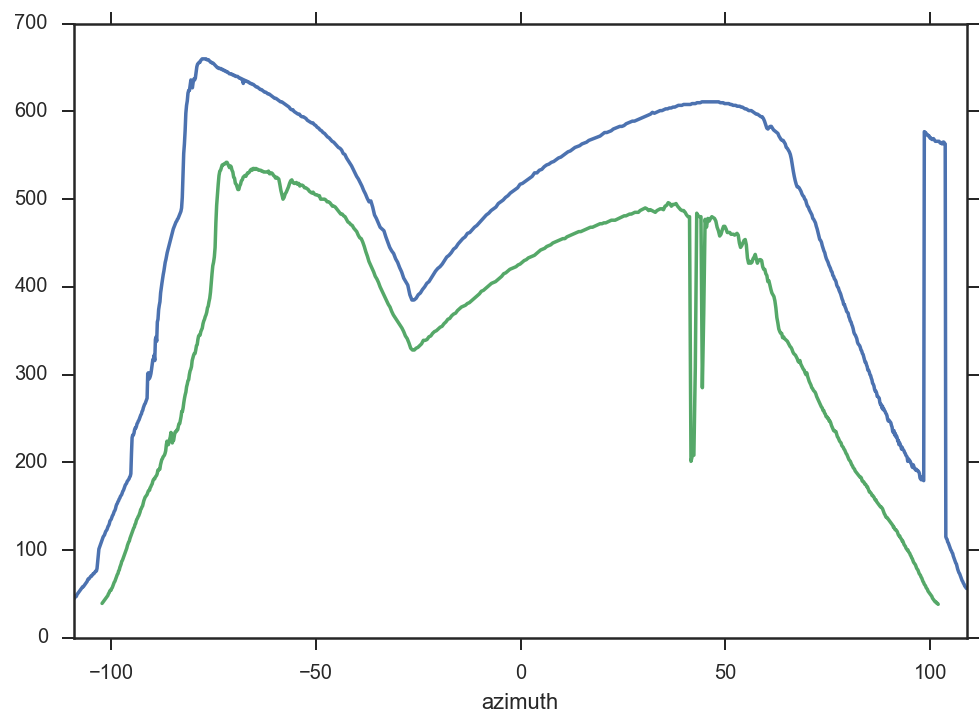

In [53]:
ldr_minutos.loc[ldr_minutos['altitude'] > 0].loc['2016-08-13'].set_index('azimuth')['median'].sort_index().plot()
ldr_minutos.loc[ldr_minutos['altitude'] > 0].loc['2016-08-29'].set_index('azimuth')['median'].sort_index().plot()

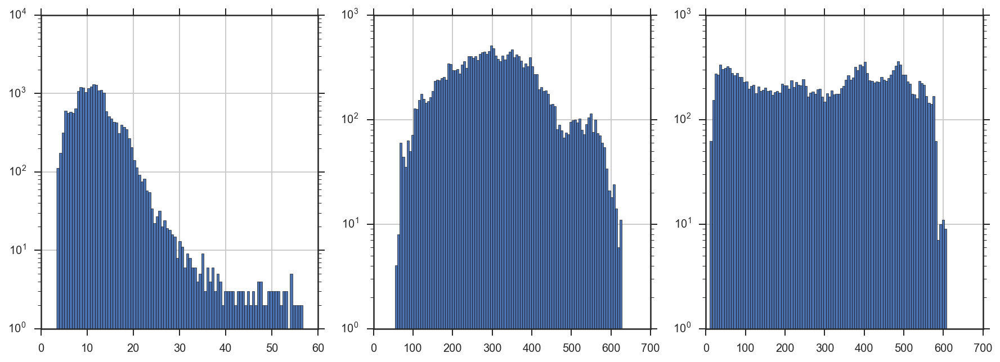

In [104]:
luz_solar = ldr_minutos.loc[ldr_minutos['altitude'] > 10].reset_index().set_index('azimuth').copy()
luz_solar['coef_alt'] = luz_solar['median'] / luz_solar['altitude']
luz_solar['coef_alt_cos'] = luz_solar['median'] * (luz_solar.altitude.apply(np.deg2rad).apply(np.cos))
luz_solar['coef_alt_sin'] = luz_solar['median'] * (luz_solar.altitude.apply(np.deg2rad).apply(np.sin))

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
luz_solar.coef_alt.hist(log=True, bins=100)
plt.subplot(1, 3, 2)
luz_solar.coef_alt_cos.hist(log=True, bins=100)
plt.subplot(1, 3, 3)
luz_solar.coef_alt_sin.hist(log=True, bins=100)

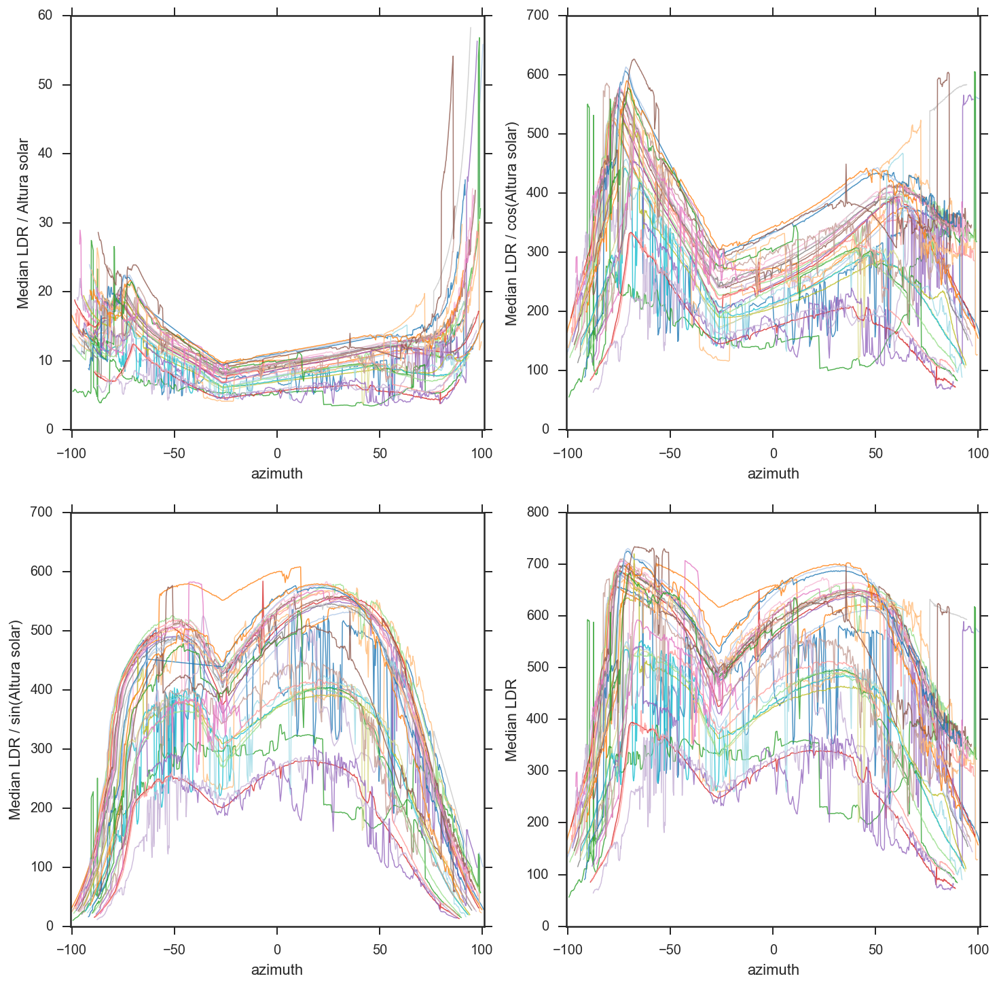

In [105]:
f = plt.figure(figsize=(12, 12))
for i, (c, ylabel) in enumerate(zip(['coef_alt', 'coef_alt_cos', 'coef_alt_sin', 'median', 'std'], 
                                    ['Median LDR / Altura solar', 'Median LDR / cos(Altura solar)', 
                                     'Median LDR / sin(Altura solar)', 'Median LDR'])):
    plt.subplot(2, 2, i + 1)
    cmap = cycle(tableau20)
    for k, day in luz_solar.groupby(luz_solar['ts'].dt.date):
        day.sort_index()[c].plot(lw=.75, alpha=.8, color=next(cmap))
    plt.ylabel(ylabel)
plt.show()

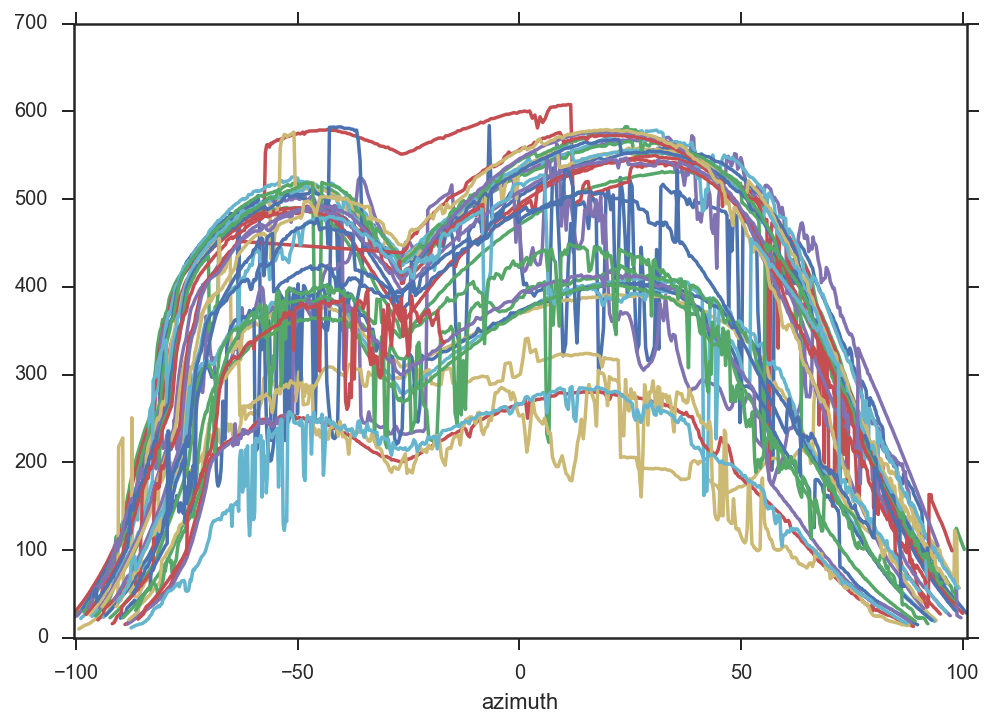

In [106]:
for k, day in luz_solar.groupby(luz_solar['ts'].dt.date):
    day.sort_index()['coef_alt_sin'].plot()

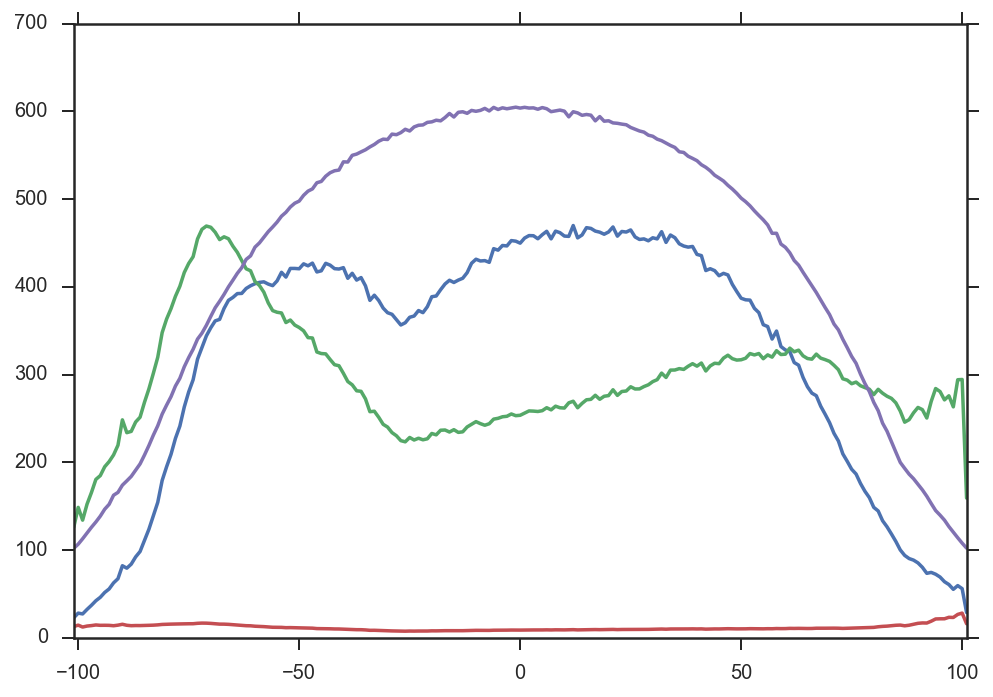

In [218]:
curva_ajuste = luz_solar.groupby(lambda x: round(x))['coef_alt_sin'].mean()
curva_ajuste.plot()
luz_solar.groupby(lambda x: round(x))['coef_alt_cos'].mean().plot()
luz_solar.groupby(lambda x: round(x))['coef_alt'].mean().plot()
curva_altura = luz_solar.groupby(lambda x: round(x))['altitude'].mean()
(curva_altura * 10).plot()

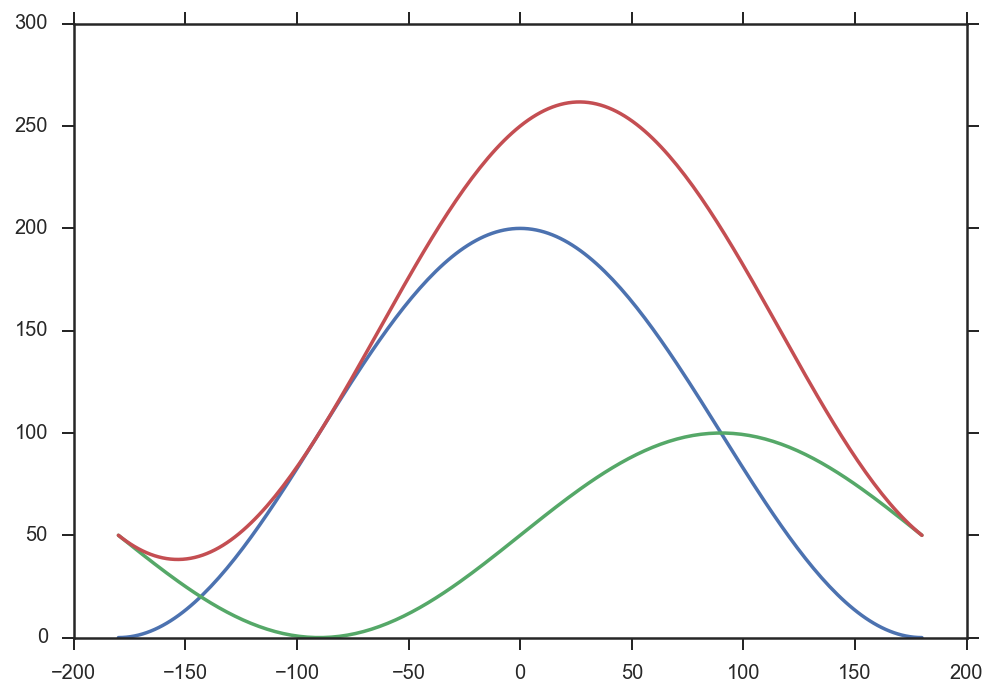

In [145]:
x_azimut = np.linspace(-180, 180, num=201)
offset = 180
y_s = 100 * (1 - np.cos(np.deg2rad(x_azimut + offset)))
offset2 = 90
y_s2 = 50 * (1 - np.cos(np.deg2rad(x_azimut + offset2)))
plt.plot(x_azimut, y_s)
plt.plot(x_azimut, y_s2)
plt.plot(x_azimut, y_s + y_s2)

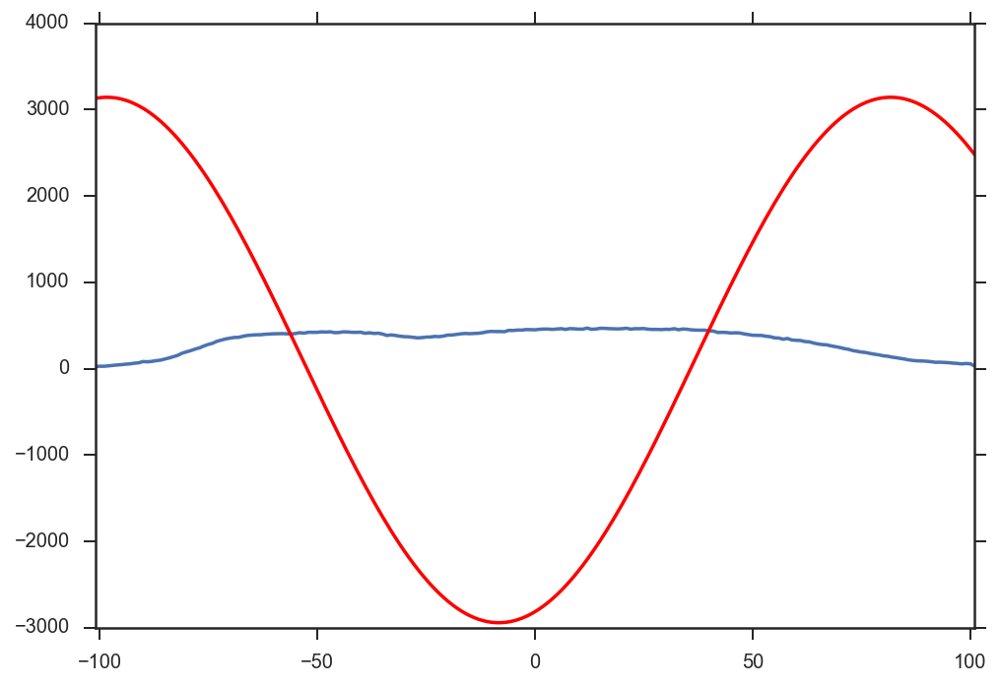

In [170]:
from scipy.optimize import leastsq

def _fitfunc(p, x) :
    return p[0] * (p[1] * np.cos(np.deg2rad(x + p[2]) * 2)) + p[3] * (p[4] * np.sin(np.deg2rad(x + p[5]) * 2)) + p[6]

def _residuals(p, y, x) :
    return y - _fitfunc(p, x)

p0 = np.array([curva_ajuste.max() / 4, 0.5, 0, curva_ajuste.mean() / 2, 0.5, 90, 100])
x_ls, cov_ls, infodict_ls, mesg, ier = leastsq(residuals, p0, args=(luz_solar['coef_alt_sin'].values, luz_solar.index), factor=1, full_output=True)
curva_ajuste.plot()
if (ier > 0) and (ier < 5):
    y_calc = _fitfunc(x_ls, curva_ajuste.index)
    plt.plot(curva_ajuste.index, y_calc, color='r')
else:
    print_warn('Solución no encontrada: "{}"\nNº llamadas: {}. infodict_ls: {}'.format(mesg, infodict_ls['nfev'], infodict_ls.keys()))

night_value = 32.0


,median,std,_step,sin_altitude,cos_altitude,sin_azimuth,cos_azimuth
ts,,,,,,,
2016-08-12 10:48:00+02:00,656.0,0,-1,0.643989,0.765034,-0.969442,0.245319
2016-08-12 10:49:00+02:00,654.0,0,-2,0.646510,0.762906,-0.968593,0.248651
2016-08-12 10:50:00+02:00,654.0,0,-1,0.649021,0.760771,-0.967729,0.251995
2016-08-12 10:51:00+02:00,656.0,0,3,0.651523,0.758629,-0.966849,0.255349
2016-08-12 10:52:00+02:00,656.0,0,0,0.654015,0.756482,-0.965954,0.258715


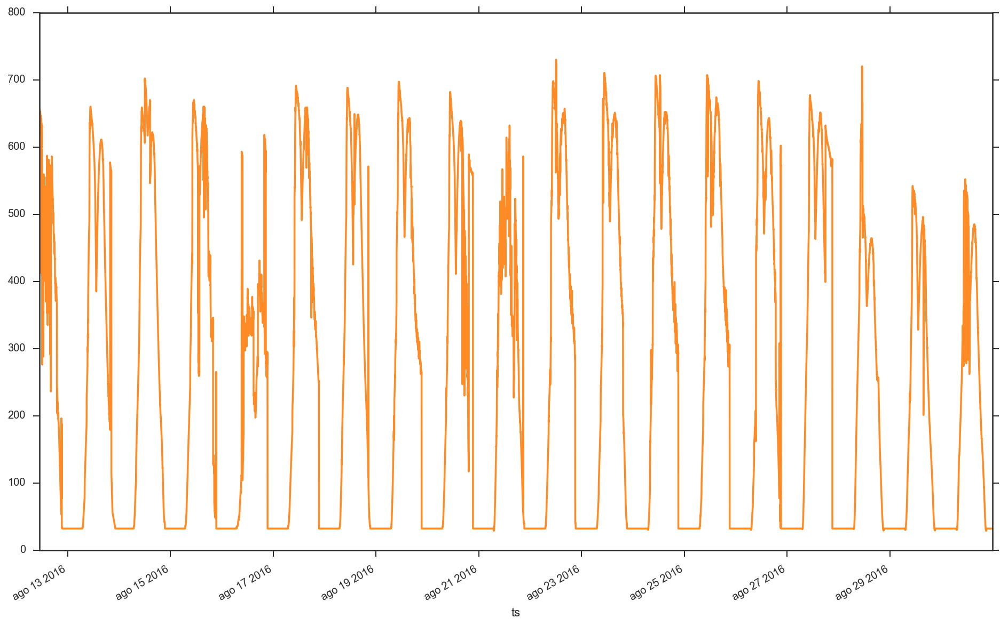

In [220]:
#x_ls, mesg
#luz_solar.corr()

night_value = ldr_minutos.loc[ldr_minutos['altitude'] < -10]['median'].median() 
print_red('night_value = {}'.format(night_value))
sim_luz_solar = ldr_minutos[['median', 'std', '_step', 'altitude', 'azimuth']].copy()

sim_luz_solar.loc[sim_luz_solar['altitude'] < -5, 'median'] = night_value
sim_luz_solar.loc[sim_luz_solar['altitude'] < -5, 'altitude'] = -5

for c in ['altitude', 'azimuth']:
    sim_luz_solar['sin_' + c] = sim_luz_solar[c].apply(lambda x: np.sin(np.deg2rad(x)))
    sim_luz_solar['cos_' + c] = sim_luz_solar[c].apply(lambda x: np.cos(np.deg2rad(x)))
    sim_luz_solar = sim_luz_solar.drop(c, axis=1)

sim_luz_solar = sim_luz_solar.loc[:'2016-08-30'].copy()
sim_luz_solar['median'].plot(figsize=FS, alpha=.9, color=tableau20[2])
sim_luz_solar.head()

#median_daily

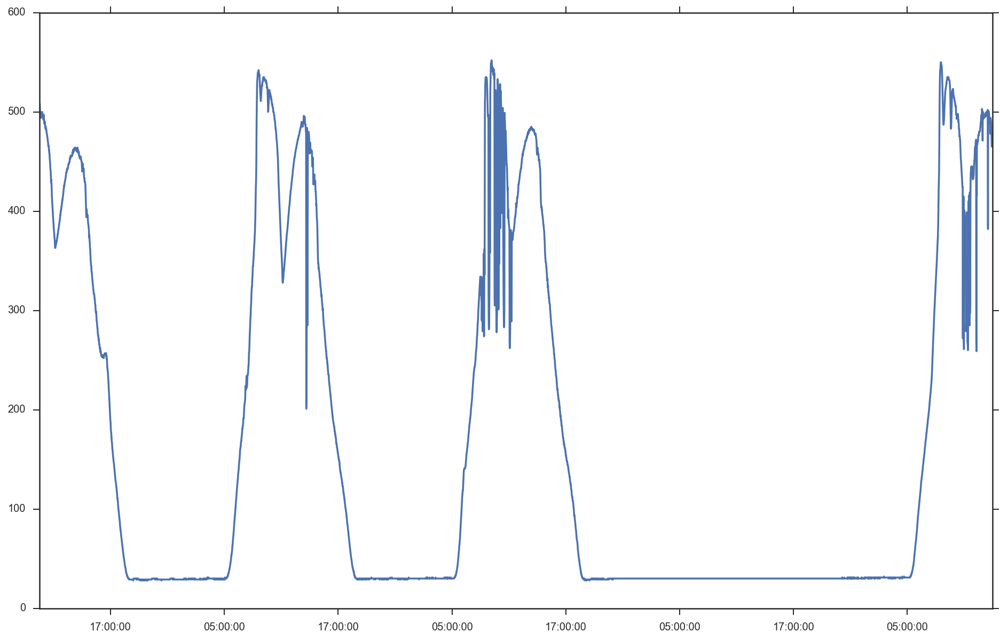

In [310]:
plt.figure(figsize=FS)
plt.plot(ldr_minutos.loc['2016-08-28 11:30':'2016-09-01 16:00', 'median'])
#plt.plot(raw.loc['2016-08-29':'2016-08-30', 'ldr'].resample('10s').median())
#plt.plot(ldr_minutos.loc['2016-08-29', 'median'])
#plt.plot(ldr_minutos.loc['2016-08-30', 'median'])
#plt.plot(ldr_minutos.loc['2016-09-01', 'median'])



In [327]:
homog = raw.ldr.resample('1s').mean().fillna(method='bfill', limit=3).fillna(method='ffill', limit=3).fillna(-100)
mf = pd.DataFrame(medfilt(homog, kernel_size=7), index=homog.index, columns=['ldr']).astype('int32')
mf['delta'] = mf.diff().fillna(0).astype('int32')
print(type(mf), mf.shape, raw.shape, homog.shape)
mf.info()
mf.head()

<class 'pandas.core.frame.DataFrame'> (2860408, 2) (2725278, 6) (2860408,)
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2860408 entries, 2016-08-12 10:46:25 to 2016-09-14 13:19:52
Freq: S
Data columns (total 2 columns):
ldr      int32
delta    int32
dtypes: int32(2)
memory usage: 43.6 MB


,ldr,delta
ts,,
2016-08-12 10:46:25,659,0
2016-08-12 10:46:26,659,0
2016-08-12 10:46:27,659,0
2016-08-12 10:46:28,659,0
2016-08-12 10:46:29,658,-1


In [330]:
sum_deltas_roll7 = mf.delta.rolling(7, center=True).sum()

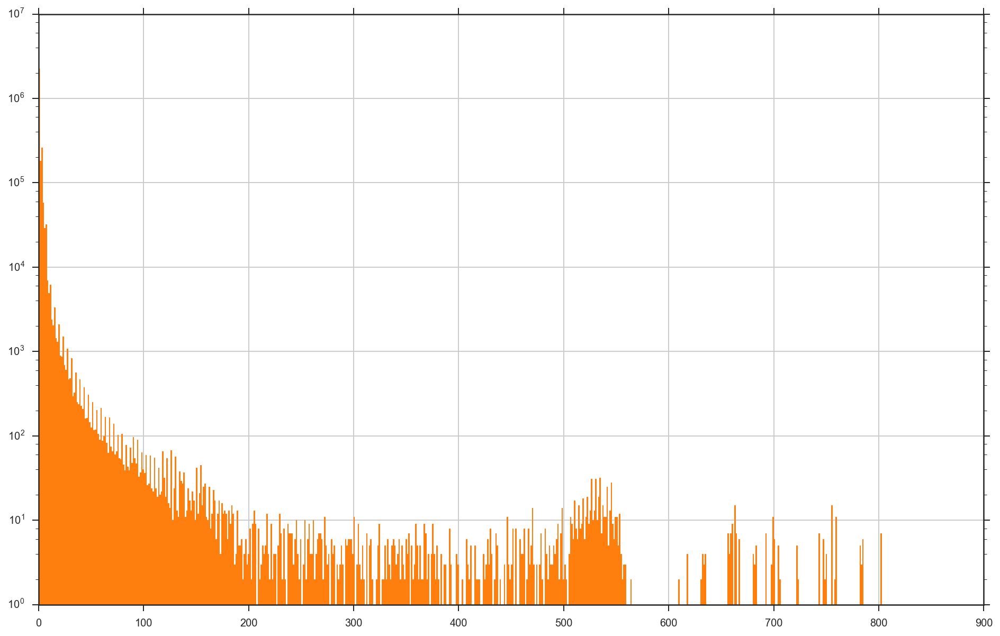

In [335]:
sum_deltas_roll7.abs().hist(log=True, bins=600, figsize=FS, lw=0, color=tableau20[2])

In [338]:
intervalos_unif = (sum_deltas_roll7.abs() > 5).cumsum()
mf['interv_unif'] = intervalos_unif
mf.head()

,ldr,delta,interv_unif
ts,,,
2016-08-12 10:46:25,659,0,0
2016-08-12 10:46:26,659,0,0
2016-08-12 10:46:27,659,0,0
2016-08-12 10:46:28,659,0,0
2016-08-12 10:46:29,658,-1,0


In [339]:
pd.concat([sum_deltas_roll7.abs().value_counts().sort_index(), 
           sum_deltas_roll7.abs().value_counts().sort_index().cumsum() / len(sum_deltas_roll7)], axis=1).head(10)

,delta,delta
0.0,1468288,0.513314
1.0,782617,0.786917
2.0,180785,0.850120
3.0,126583,0.894373
4.0,134415,0.941365
5.0,58033,0.961653
6.0,29242,0.971876
7.0,20316,0.978979
8.0,11740,0.983083
9.0,6912,0.985500


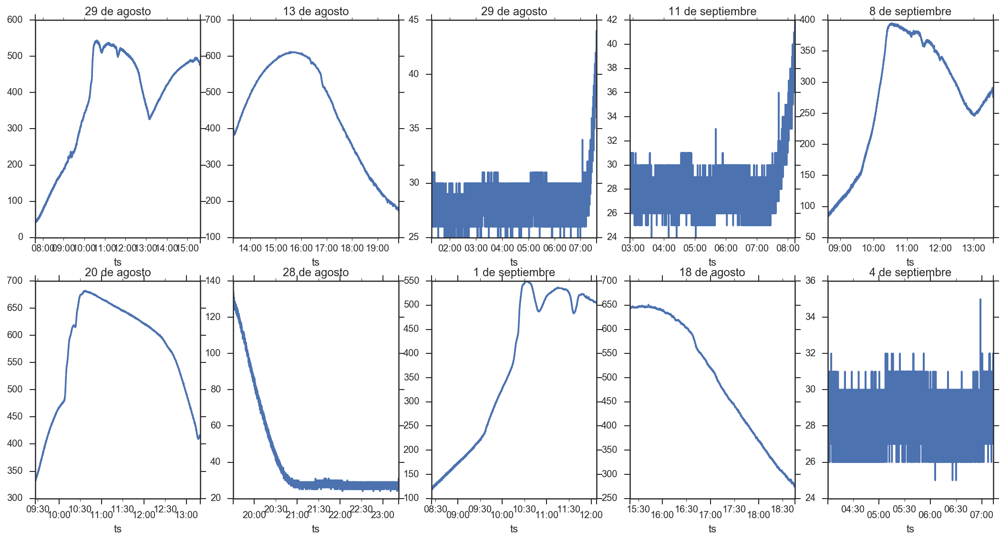

In [356]:
intervalos_largos = mf[mf.ldr > 0].groupby('interv_unif').delta.count().sort_values(ascending=False).head(10)
dfs_largos = []
plt.figure(figsize=(18, 9))
for i, intv in enumerate(intervalos_largos.index):
    df = mf[mf.interv_unif == intv]
    dfs_largos.append(df)
    plt.subplot(2, 5, i + 1)
    plt.title('{:%-d de %B}'.format(df.index[0]))
    plt.xlabel('')
    df.ldr.plot()

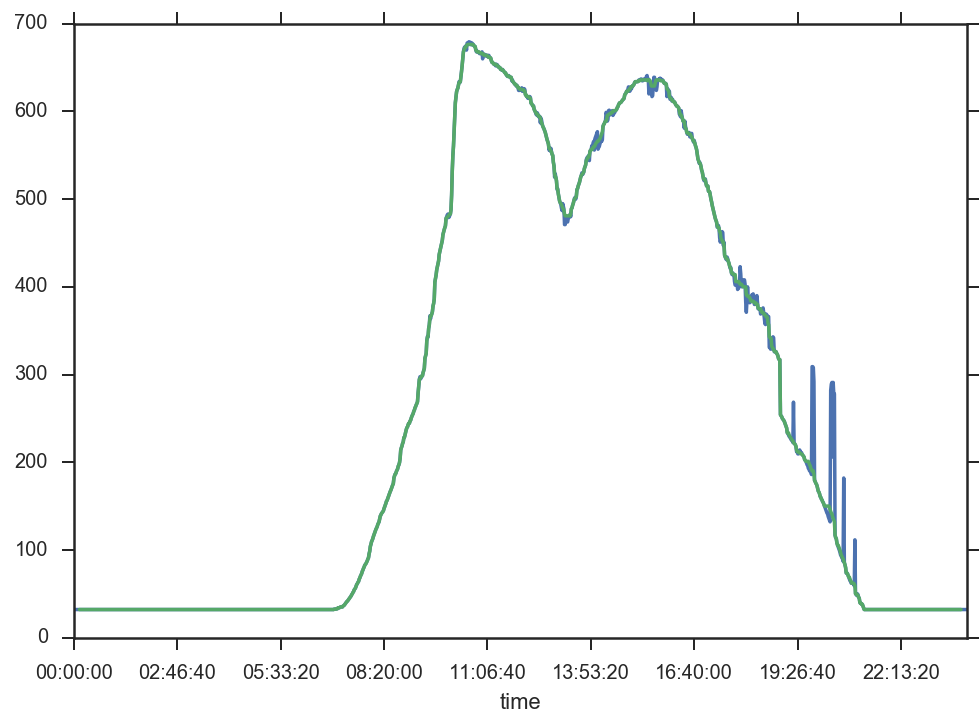

In [315]:
#curva_ajuste
#luz_solar = ldr_minutos.loc[ldr_minutos['altitude'] > 10].reset_index().set_index('azimuth').copy()
#luz_solar['coef_alt'] = luz_solar['median'] / luz_solar['altitude']
#luz_solar['coef_alt_cos'] = luz_solar['median'] * (luz_solar.altitude.apply(np.deg2rad).apply(np.cos))
#luz_solar['coef_alt_sin'] = luz_solar['median'] * (luz_solar.altitude.apply(np.deg2rad).apply(np.sin))
gb_time = sim_luz_solar.groupby(lambda x: x.time)
y_medday = gb_time['median'].median()
y_medday.plot()
y_medday.rolling(19, center=True).median().plot()

plt.show()


14400


/Users/uge/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:14: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


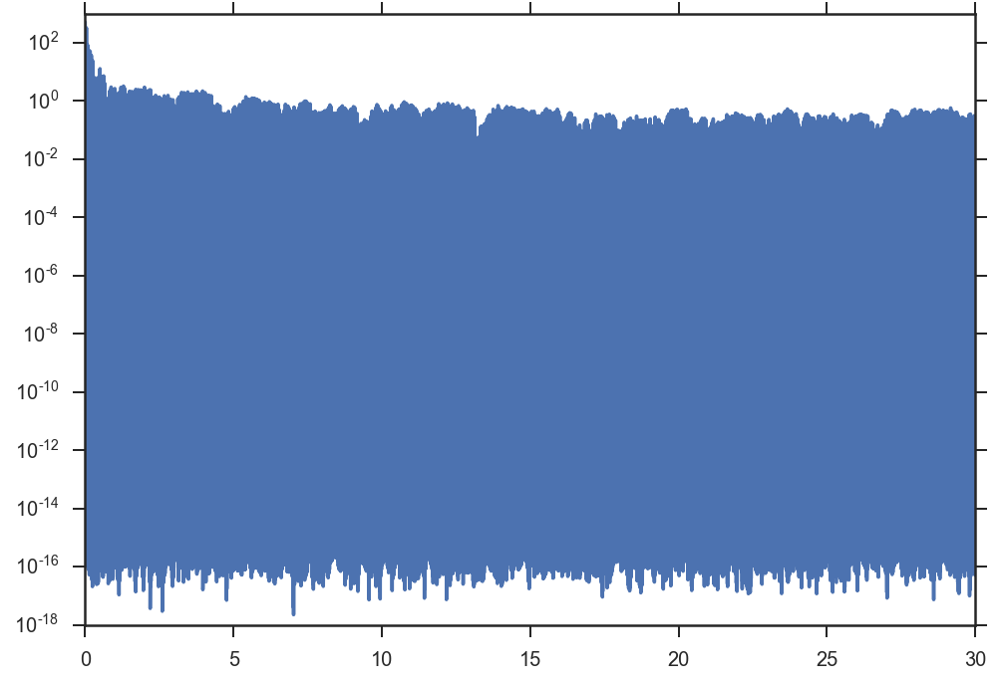

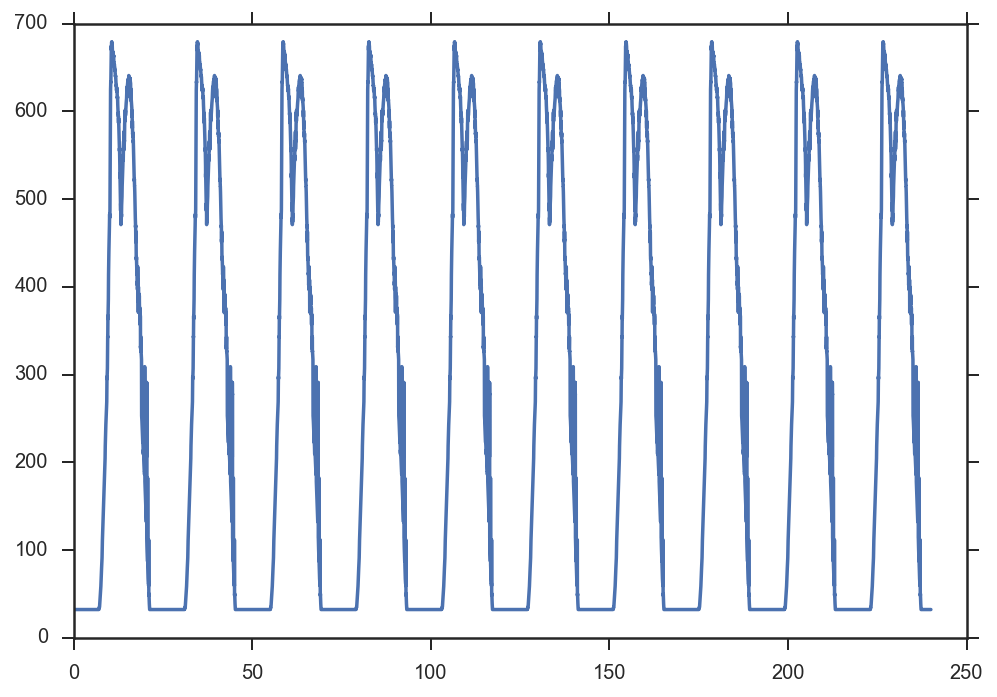

In [255]:
#plt.plot(np.fft.rfft(sim_luz_solar.loc[:'2016-08-30']['median']), lw=.5)

#y = sim_luz_solar.loc[:'2016-08-30']['median'].values
N = y.shape[0]
print(N)
T = 1 / (60)
x = np.linspace(0.0, N*T, N)

#yf = scipy.fftpack.fft(y)
yf = np.fft.rfft(y)
xf = np.linspace(0.0, 1.0/(2.0*T), N/2)

fig, ax = plt.subplots()
y_cal = 2.0/N * np.abs(yf[:N/2])
#plt.semilogy(xf, 2.0/N * np.abs(yf[0:N/2]))
ax.semilogy(xf, y_cal)
#ax.set_xlim((1, N/2))
#ax.set_ylim((0, np.max(y_cal[2:])))
plt.figure()
plt.plot(x, y)

In [276]:
x = np.array(list(range(len(y_medday.values))))
y = y_medday.values
spline = inter.InterpolatedUnivariateSpline(x, y)



array([ 32.,  32.,  32., ...,  32.,  32.,  32.])

/Users/uge/anaconda/envs/py35/lib/python3.5/site-packages/numpy/lib/polynomial.py:595: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


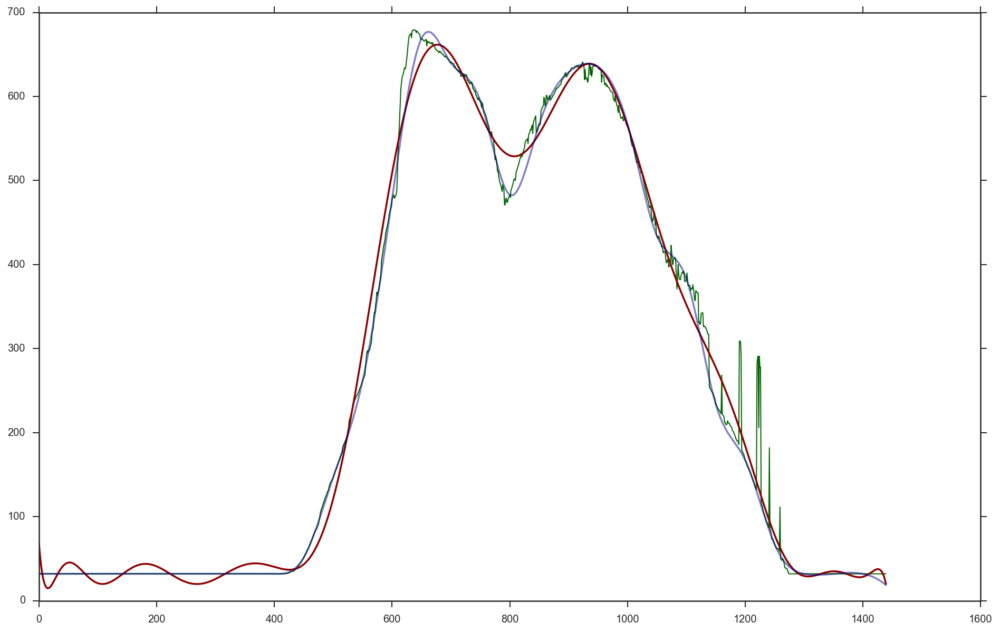

In [284]:
#plt.plot(y_medday)

x = np.array(list(range(len(y_medday.values))))
y = y_medday.values
fit_poly = np.polyfit(x, y, 20)

plt.figure(figsize=FS)
plt.plot(x, y, color='darkgreen', lw=1)
plt.plot(x, np.polyval(fit_poly, x), color='darkred')

plt.plot(x, inter.InterpolatedUnivariateSpline(x[::50], y[::50])(x), color='darkblue', alpha=.5)

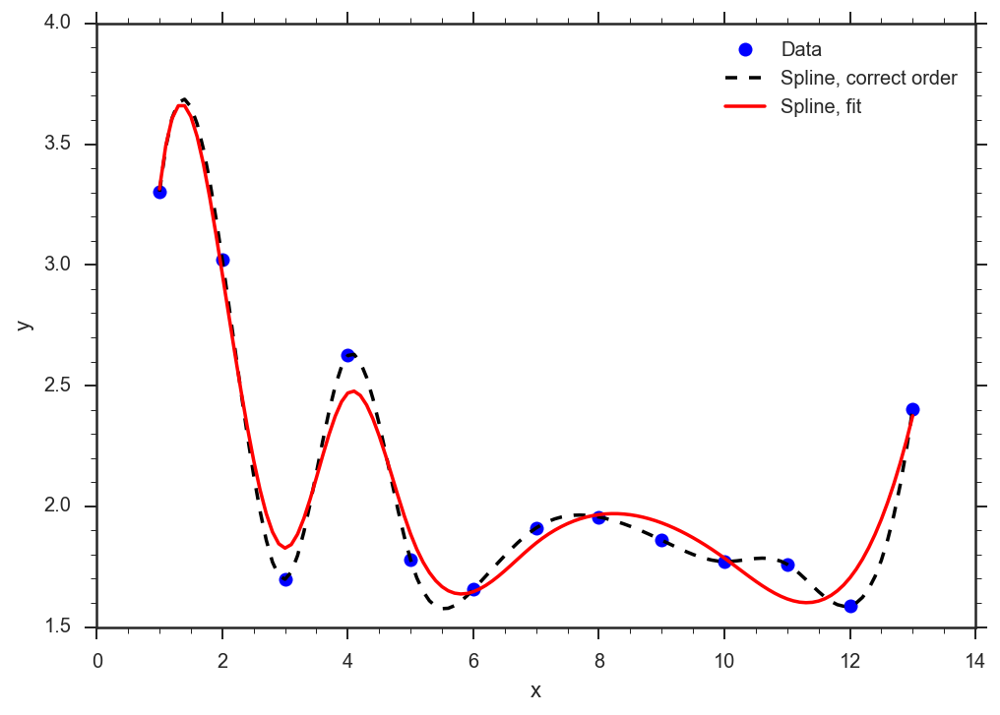

In [272]:
import scipy.interpolate as inter
import numpy as np
import pylab as plt

x = np.array([13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
y = np.array([2.404070, 1.588134, 1.760112, 1.771360, 1.860087,
          1.955789, 1.910408, 1.655911, 1.778952, 2.624719,
          1.698099, 3.022607, 3.303135])
xx = np.arange(1,13.01,0.1)
s1 = inter.InterpolatedUnivariateSpline (x, y)
s1rev = inter.InterpolatedUnivariateSpline (x[::-1], y[::-1])
# Use a smallish value for s
s2 = inter.UnivariateSpline (x[::-1], y[::-1], s=0.1)
plt.plot (x, y, 'bo', label='Data')
plt.plot (xx, s1rev(xx), 'k--', label='Spline, correct order')
plt.plot (xx, s2(xx), 'r-', label='Spline, fit')
plt.minorticks_on()
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

/Users/uge/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


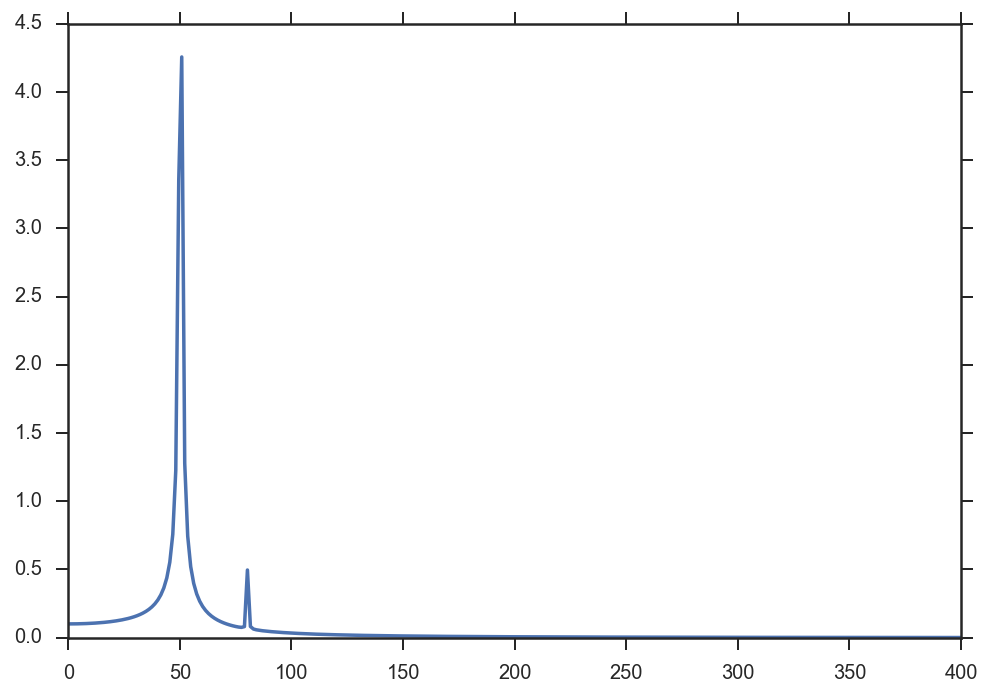

In [204]:
N = 600
# sample spacing
T = 1.0 / 800.0
x = np.linspace(0.0, N*T, N)
y = 6 * np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)
yf = scipy.fftpack.fft(y)
xf = np.linspace(0.0, 1.0/(2.0*T), N/2)

fig, ax = plt.subplots()
ax.plot(xf, 2.0/N * np.abs(yf[:N/2]))
plt.show()

In [80]:
from scipy.optimize import leastsq

def fitfunc(p, x) :
    return (p[0] * (1 - p[1] * np.sin(2 * np.pi / (24 * 3600) * (x + p[2]))))

def residuals(p, y, x) :
    return y - fitfunc(p, x)

def fit(tsdf) :
    tsgb = tsdf.groupby(tsdf.timeofday).mean()
    p0 = np.array([tsgb['conns'].mean(), 1.0, 0.0])
    plsq, suc = leastsq(_residuals, p0, args=(tsgb['conns'], np.array(tsgb.index)))
                                     
    return plsq


suc

In [316]:
#np.fft.rfft(curva_ajuste)

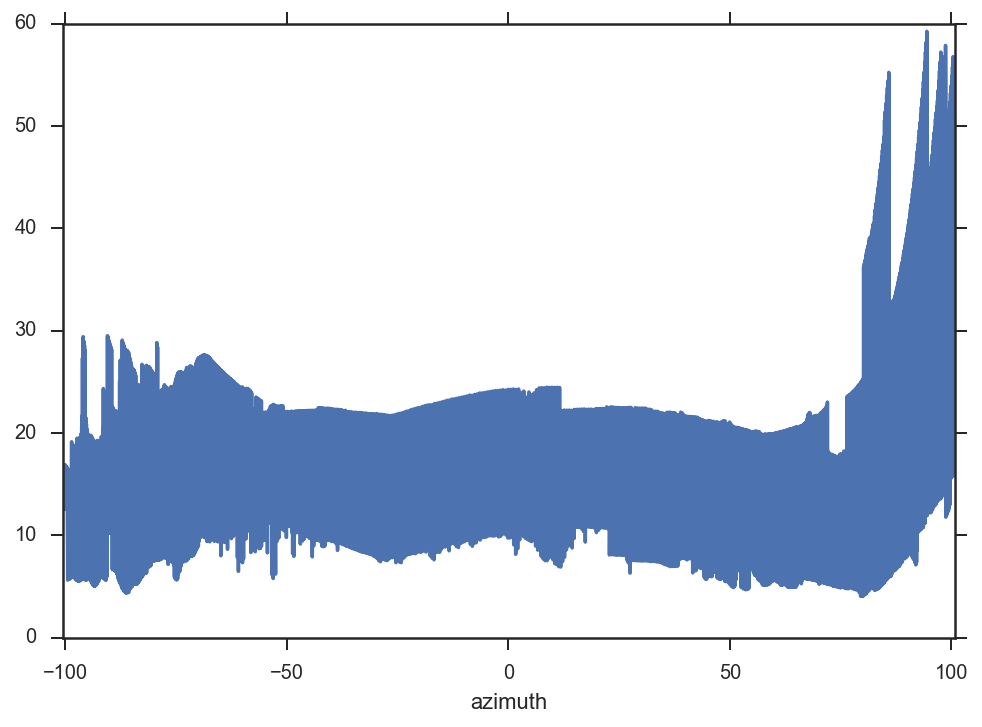

In [95]:
(luz_solar['median'] / (luz_solar['altitude'] * luz_solar.altitude.apply(np.deg2rad).apply(np.cos))).sort_index().plot()

-101     22.631176
-100     27.914847
-99      26.998100
-98      32.145848
-97      36.856586
-96      42.034471
-95      45.956342
-94      51.494683
-93      55.501458
-92      62.399938
-91      67.187271
-90      81.961016
-89      79.180095
-88      83.774039
-87      92.032434
-86      98.187007
-85     110.888305
-84     123.584445
-83     138.999016
-82     154.224848
-81     179.275648
-80     194.813811
-79     209.009535
-78     227.142191
-77     241.182446
-76     263.001634
-75     280.171660
-74     294.001067
-73     317.524436
-72     330.804348
           ...    
 72     224.209595
 73     209.551391
 74     201.017372
 75     191.990058
 76     186.538197
 77     175.759023
 78     166.882194
 79     159.669518
 80     148.536602
 81     144.423244
 82     133.268653
 83     126.362429
 84     118.168707
 85     109.621774
 86      99.976629
 87      93.724742
 88      90.145172
 89      88.352460
 90      85.207966
 91      80.166700
 92      73.304198
 93      74.